In [ ]:
from google.colab import drive
drive.mount('/content/drive')


Mounted at /content/drive


In [ ]:
%cd /content/drive/MyDrive

/content/drive/MyDrive


In [ ]:
%pwd

'/content/drive/MyDrive'

In [ ]:
# 설치되어 있다면 이것
%cd /content/drive/MyDrive/yolov5

/content/drive/MyDrive/yolov5


In [ ]:
#clone YOLOv5
!git clone https://github.com/ultralytics/yolov5
%cd yolov5
%pip install -qr requirements.txt

Cloning into 'yolov5'...
remote: Enumerating objects: 17045, done.
remote: Counting objects: 100% (23/23), done.
remote: Compressing objects: 100% (15/15), done.
remote: Total 17045 (delta 10), reused 18 (delta 8), pack-reused 17022 (from 1)
Receiving objects: 100% (17045/17045), 15.67 MiB | 16.43 MiB/s, done.
Resolving deltas: 100% (11704/11704), done.
/content/drive/MyDrive/yolov5


In [ ]:
!pip install Pillow==10.3

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.5/4.5 MB 51.1 MB/s eta 0:00:00
  Attempting uninstall: Pillow
    Found existing installation: pillow 10.4.0
    Uninstalling pillow-10.4.0:
      Successfully uninstalled pillow-10.4.0


In [ ]:
!mkdir -p Train/labels
!mkdir -p Train/images
# yolov5n.pt / data.yaml 파일 넣어야함 -> yolov5 폴더에

In [ ]:
import torch
import os
from IPython.display import Image, clear_output  # to display images

In [ ]:
%pwd

'/content/drive/MyDrive/yolov5'

In [ ]:
import numpy as np
import tensorflow as tf
import os
from PIL import Image
from tensorflow.python.eager.context import eager_mode

def _preproc(image, output_height=512, output_width=512, resize_side=512):
    ''' imagenet-standard: aspect-preserving resize to 256px smaller-side, then central-crop to 224px'''
    with eager_mode():
        h, w = image.shape[0], image.shape[1]
        scale = tf.cond(tf.less(h, w), lambda: resize_side / h, lambda: resize_side / w)
        resized_image = tf.compat.v1.image.resize_bilinear(tf.expand_dims(image, 0), [int(h*scale), int(w*scale)])
        cropped_image = tf.compat.v1.image.resize_with_crop_or_pad(resized_image, output_height, output_width)
        return tf.squeeze(cropped_image)

def Create_npy(imagespath, imgsize, ext) :
    images_list = [img_name for img_name in os.listdir(imagespath) if
                os.path.splitext(img_name)[1].lower() == '.'+ext.lower()]
    calib_dataset = np.zeros((len(images_list), imgsize, imgsize, 3), dtype=np.float32)

    for idx, img_name in enumerate(sorted(images_list)):
        img_path = os.path.join(imagespath, img_name)
        try:
            if os.path.getsize(img_path) == 0:
                print(f"Error: {img_path} is empty.")
                continue

            img = Image.open(img_path)
            img = img.convert("RGB")
            img_np = np.array(img)

            img_preproc = _preproc(img_np, imgsize, imgsize, imgsize)
            calib_dataset[idx,:,:,:] = img_preproc.numpy().astype(np.uint8)
            print(f"Processed image {img_path}")

        except Exception as e:
            print(f"Error processing image {img_path}: {e}")

    np.save('calib_set.npy', calib_dataset)



In [ ]:
Create_npy('./Train/images', 640, 'jpg')

In [ ]:
!python train.py  --img 640 --batch 16 --epochs 300 --data /content/drive/MyDrive/yolov5/data.yaml --weights yolov5n.pt --cache

스트리밍 출력 내용이 길어서 마지막 5000줄이 삭제되었습니다.
  with torch.cuda.amp.autocast(amp):
    261/299      2.31G    0.01144    0.01227  0.0007161         98        640:  35% 22/62 [00:01<00:03, 11.62it/s]/content/drive/MyDrive/yolov5/train.py:412: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(amp):
    261/299      2.31G    0.01143    0.01214  0.0007084         76        640:  35% 22/62 [00:02<00:03, 11.62it/s]/content/drive/MyDrive/yolov5/train.py:412: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(amp):
    261/299      2.31G    0.01145    0.01221  0.0007009         86        640:  39% 24/62 [00:02<00:03, 11.05it/s]/content/drive/MyDrive/yolov5/train.py:412: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with tor

In [ ]:
%load_ext tensorboard
%tensorboard --logdir runs

<IPython.core.display.Javascript object>

In [ ]:
!python detect.py --weights runs/train/exp2/weights/best.pt --img 640 --conf 0.1 --source /content/drive/MyDrive/yolov5/Train/images

detect: weights=['runs/train/exp2/weights/best.pt'], source=/content/drive/MyDrive/yolov5/Train/images, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.1, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_format=0, save_csv=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-383-g1435a8ee Python-3.10.12 torch-2.5.0+cu121 CUDA:0 (NVIDIA L4, 22700MiB)

Fusing layers... 
Model summary: 157 layers, 1763224 parameters, 0 gradients, 4.1 GFLOPs
image 1/982 /content/drive/MyDrive/yolov5/Train/images/00000000.png: 640x640 3 bowls, 1 scissors, 1 knife, 6.8ms
image 2/982 /content/drive/MyDrive/yolov5/Train/images/00000001.png: 640x640 3 bowls, 1 scissors, 1 knife, 6.8ms
image 3/982 /content/drive/MyDrive/yolov5/Train/images/00000002.p

In [ ]:
pip install ultralytics

In [ ]:
import ultralytics

In [ ]:
!python detect.py --weights runs/train/exp2/weights/best.pt --source /content/drive/MyDrive/yolov5/video/video_1.mp4

detect: weights=['runs/train/exp2/weights/best.pt'], source=/content/drive/MyDrive/yolov5/video/video_1.mp4, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_format=0, save_csv=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-383-g1435a8ee Python-3.10.12 torch-2.5.0+cu121 CUDA:0 (NVIDIA L4, 22700MiB)

Fusing layers... 
Model summary: 157 layers, 1763224 parameters, 0 gradients, 4.1 GFLOPs
WARNING ⚠️ NMS time limit 0.550s exceeded
video 1/1 (1/316) /content/drive/MyDrive/yolov5/video/video_1.mp4: 640x640 3 bowls, 1 scissors, 1 knife, 7.2ms
video 1/1 (2/316) /content/drive/MyDrive/yolov5/video/video_1.mp4: 640x640 3 bowls, 1 scissors, 1 knife, 7.2ms
video 1/1 (3/316) /co

In [ ]:
!python detect.py --weights runs/train/exp2/weights/best.pt --source /content/drive/MyDrive/yolov5/video/video_2.mp4

detect: weights=['runs/train/exp2/weights/best.pt'], source=/content/drive/MyDrive/yolov5/video/video_2.mp4, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_format=0, save_csv=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-383-g1435a8ee Python-3.10.12 torch-2.5.0+cu121 CUDA:0 (NVIDIA L4, 22700MiB)

Fusing layers... 
Model summary: 157 layers, 1763224 parameters, 0 gradients, 4.1 GFLOPs
video 1/1 (1/316) /content/drive/MyDrive/yolov5/video/video_2.mp4: 640x640 2 bowls, 1 scissors, 1 knife, 7.0ms
video 1/1 (2/316) /content/drive/MyDrive/yolov5/video/video_2.mp4: 640x640 2 bowls, 1 scissors, 1 knife, 6.9ms
video 1/1 (3/316) /content/drive/MyDrive/yolov5/video/video_2.m

In [ ]:
!python detect.py --weights runs/train/exp2/weights/best.pt --source /content/drive/MyDrive/yolov5/video/video_3.mp4

detect: weights=['runs/train/exp2/weights/best.pt'], source=/content/drive/MyDrive/yolov5/video/video_3.mp4, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_format=0, save_csv=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-383-g1435a8ee Python-3.10.12 torch-2.5.0+cu121 CUDA:0 (NVIDIA L4, 22700MiB)

Fusing layers... 
Model summary: 157 layers, 1763224 parameters, 0 gradients, 4.1 GFLOPs
WARNING ⚠️ NMS time limit 0.550s exceeded
video 1/1 (1/350) /content/drive/MyDrive/yolov5/video/video_3.mp4: 640x640 2 bowls, 1 scissors, 1 knife, 8.2ms
video 1/1 (2/350) /content/drive/MyDrive/yolov5/video/video_3.mp4: 640x640 2 bowls, 1 scissors, 1 knife, 6.9ms
video 1/1 (3/350) /co

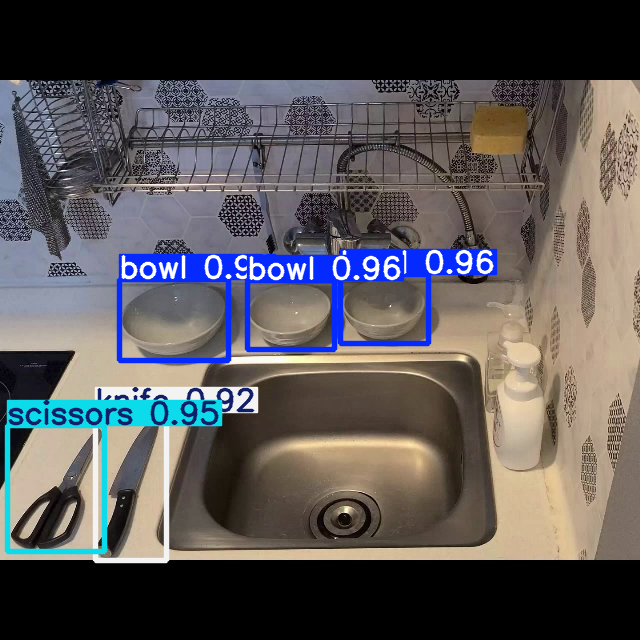

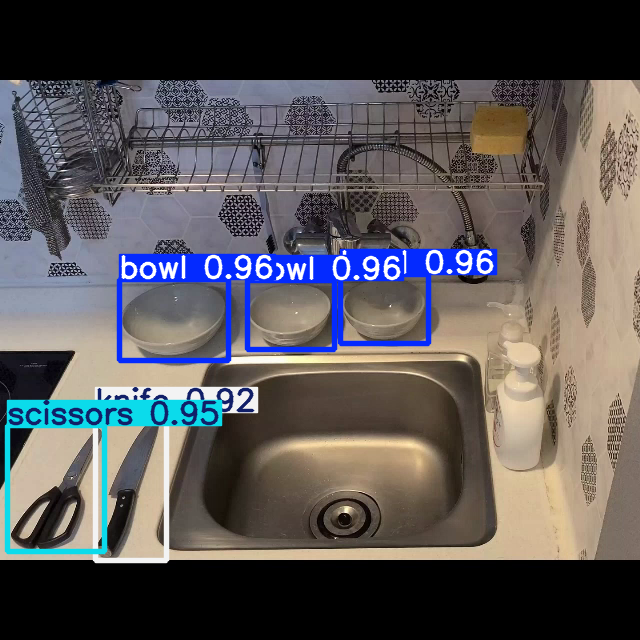

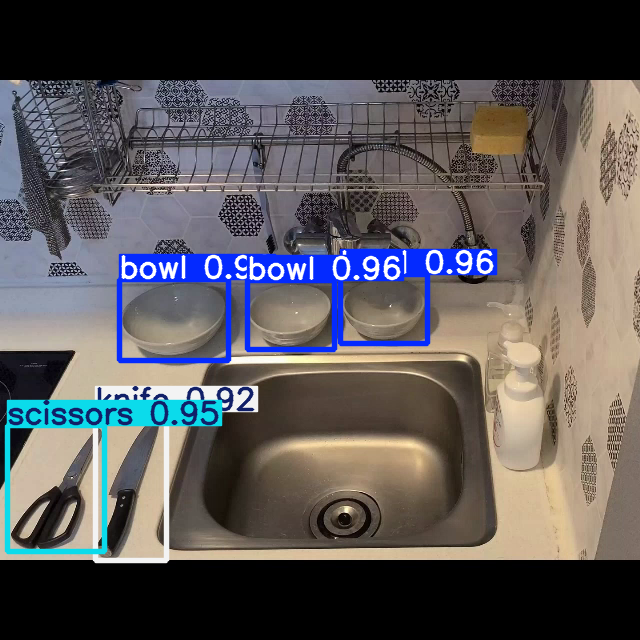

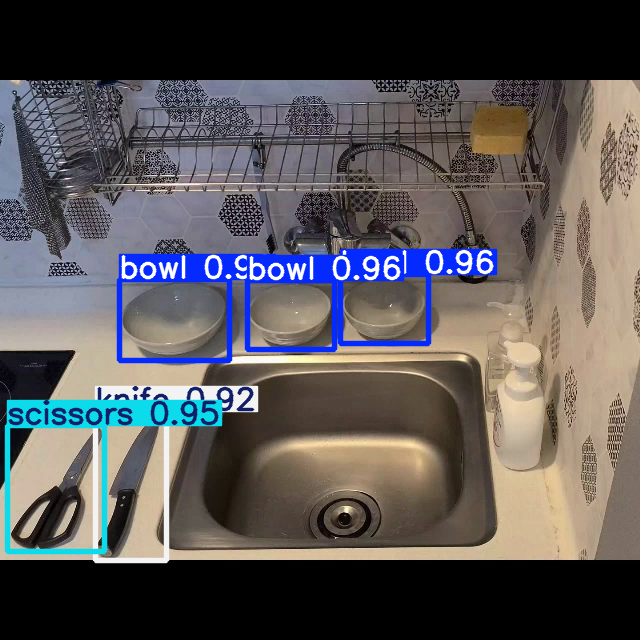

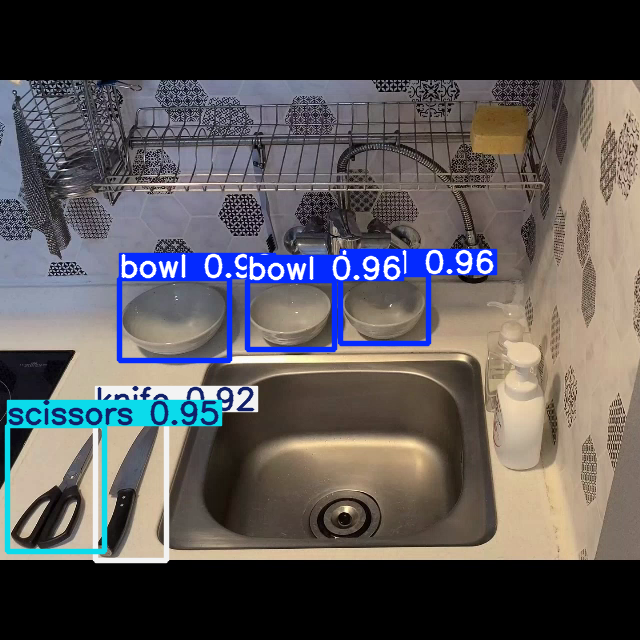

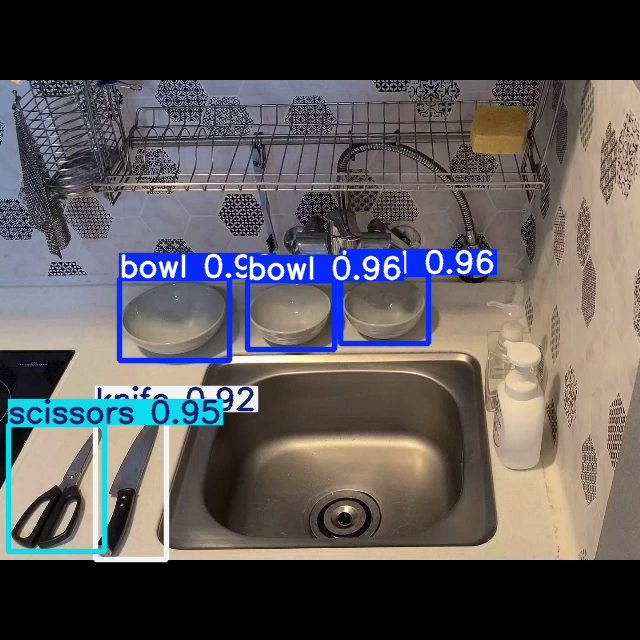

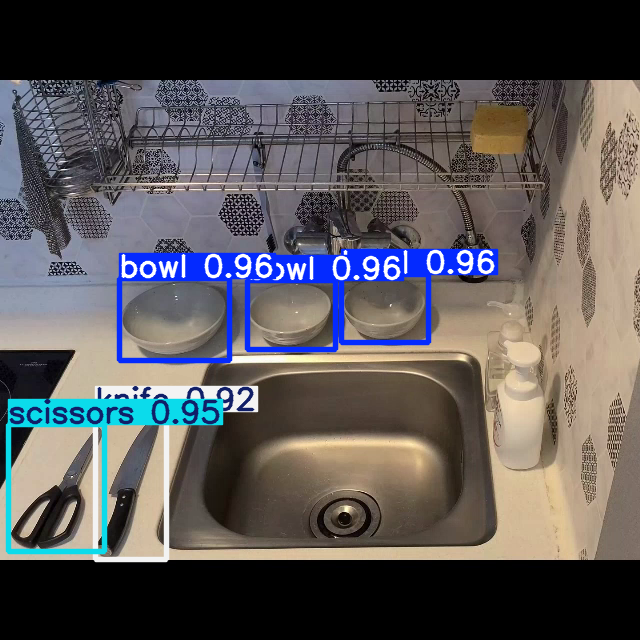

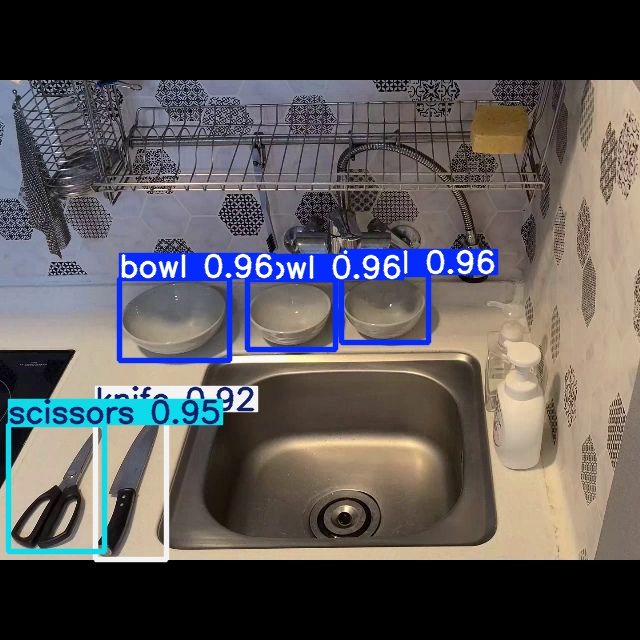

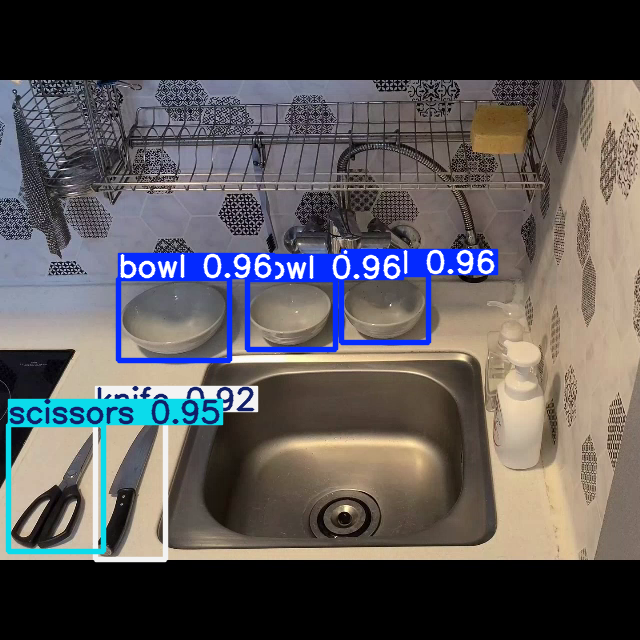

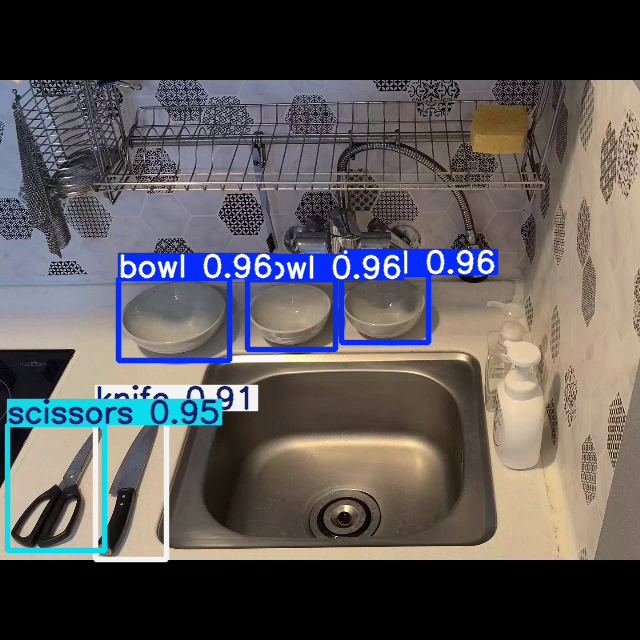

In [ ]:
import glob
from IPython.display import Image, display

for imageName in glob.glob('/content/drive/MyDrive/yolov5/runs/detect/exp/*.png')[:10]:
    display(Image(filename=imageName))
    print("\n")

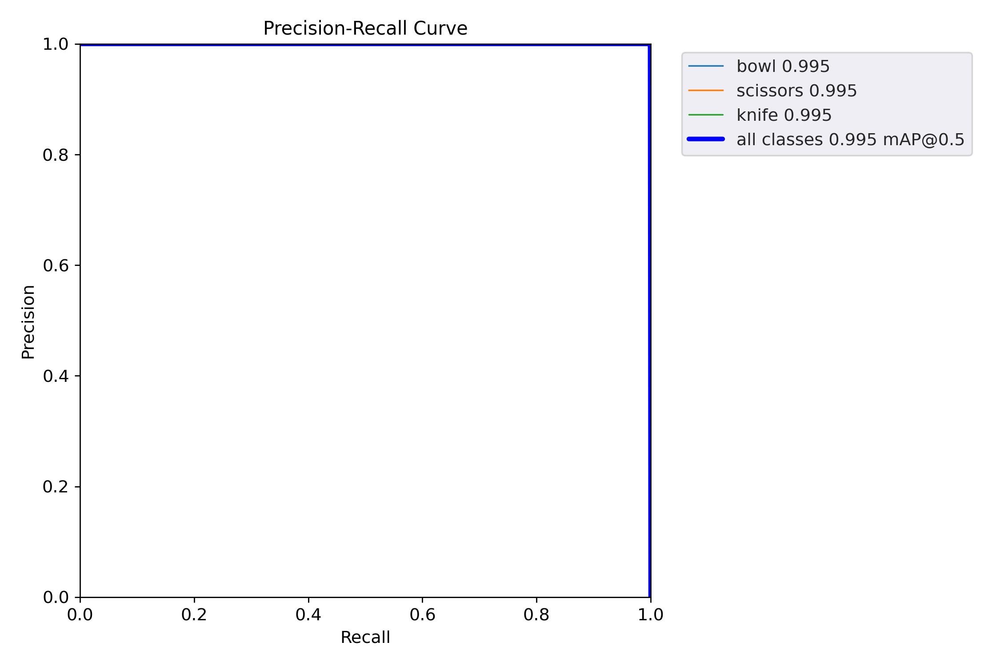

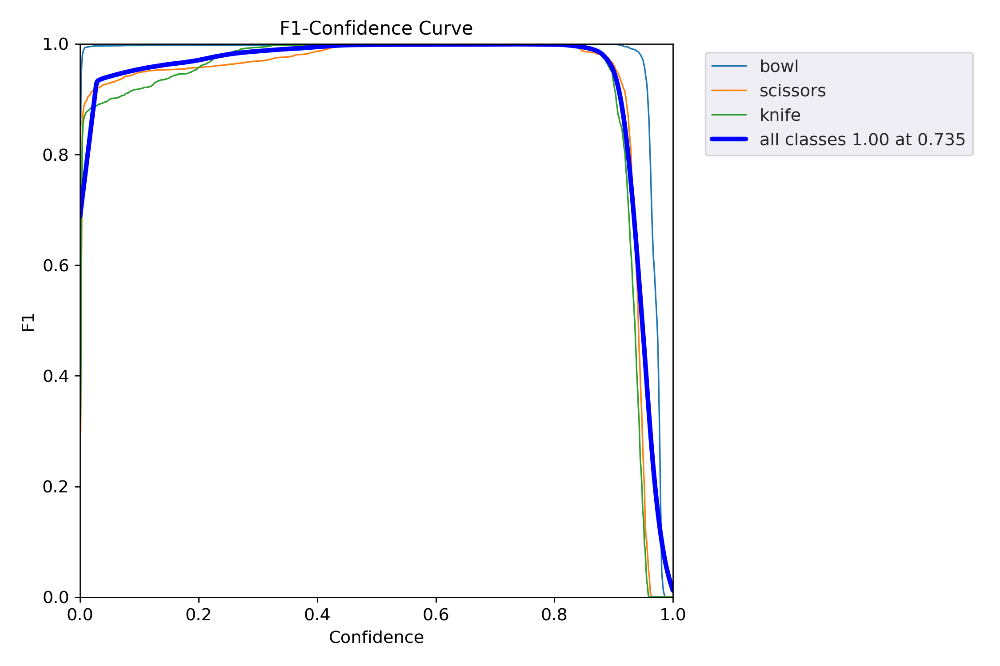

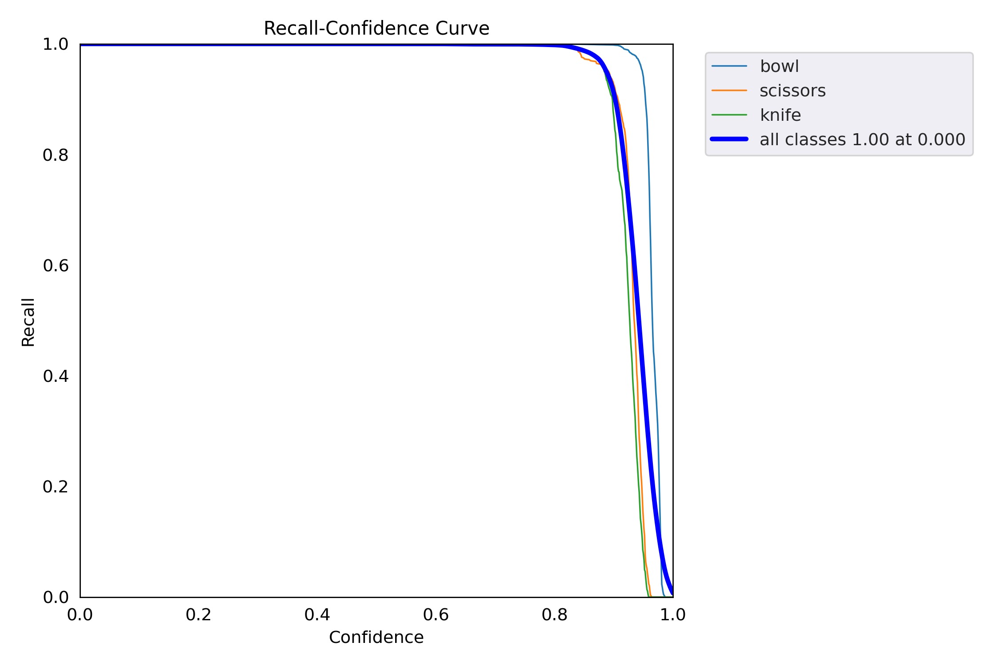

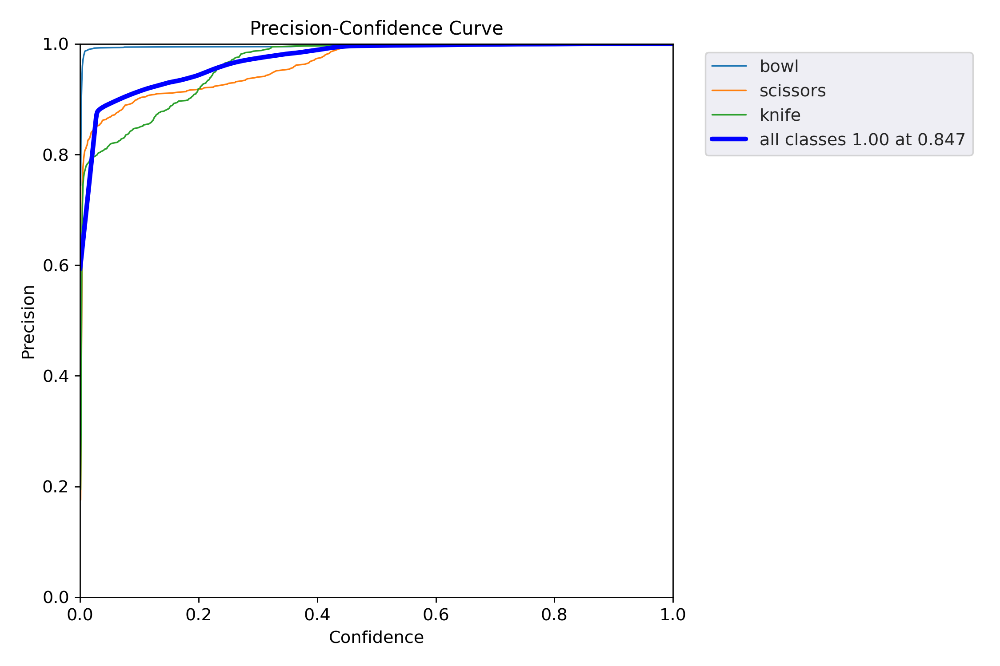

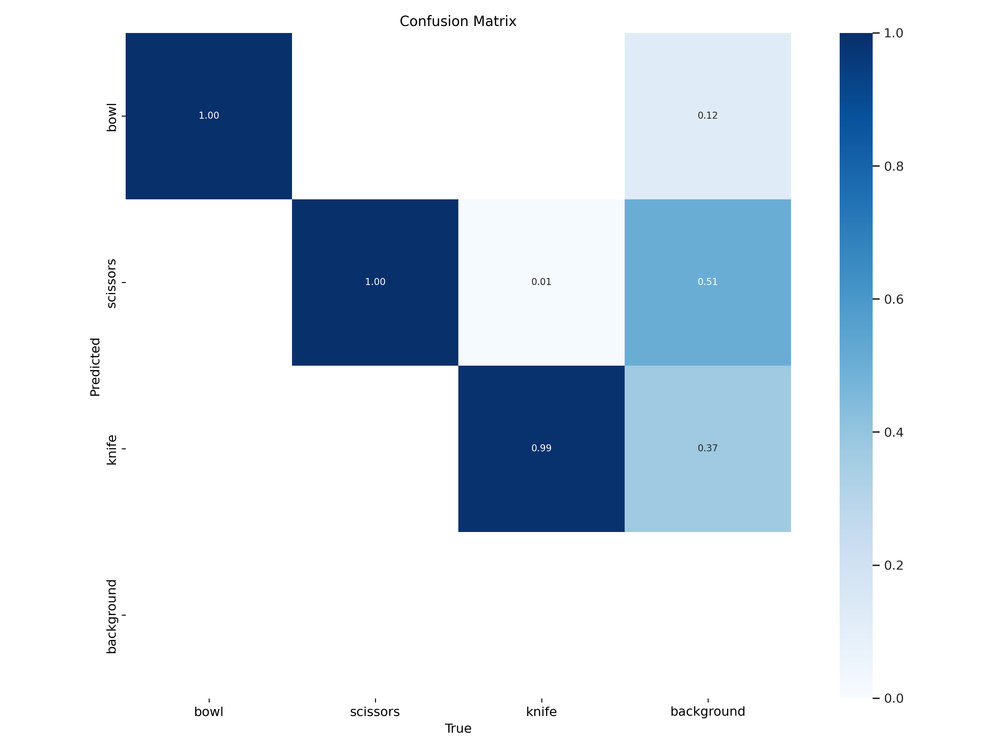

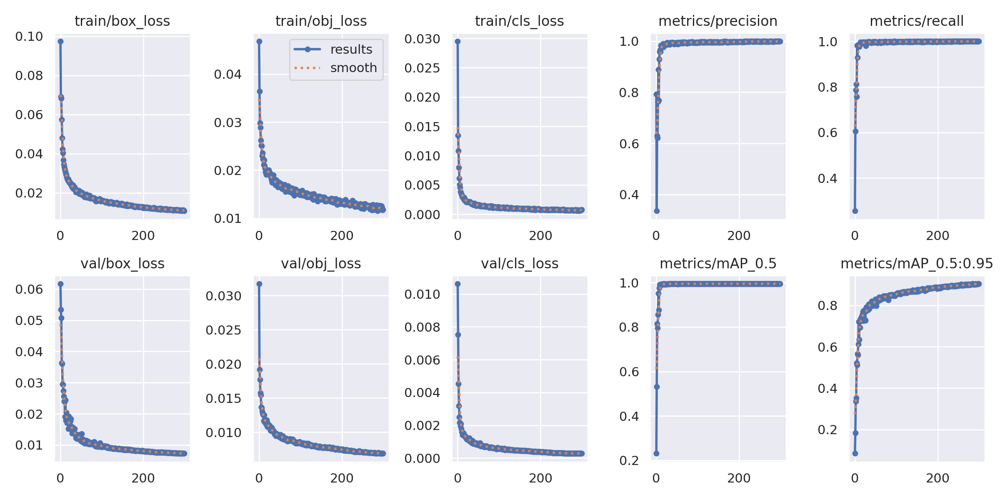

In [ ]:
import glob
from IPython.display import Image, display

for imageName in glob.glob('/content/drive/MyDrive/yolov5/runs/train/exp2/*.png')[:10]:
    display(Image(filename=imageName))
    print("\n")